# Quality Criterion for Semi-Sequential Registration

In [ ]:
import kornia as K
import kornia.augmentation as KA
import matplotlib.pyplot as plt
import numpy as np
import math
import torch
import csv
import time
import os

from leafalignment.utils import convert_image_to_tensor, match_sizes_resize, group_by_argmax, find_roi_rotation, affine_warp_expand, affine_warp_image, affine_warp_points, load_config
from leafalignment.DatasetTools.LeafImageSeries import LeafDataset
from leafalignment.masking import fetch_image_mask_pair
from leafalignment.loftr import loftr_match, filter_matches_by_confidence, fit_tps_torch, warp_tps_torch, warp_tps_points_torch, torch_tps, fetch_keypoints
from leafalignment.plotting import plot_image_pair, plot_overlay, plot_match_coverage, plot_img_transform, plot_matches, plot_matches_conf, plot_image_series

In [ ]:
leaf = LeafDataset(
    base_dir='../../leaf-image-sequences',
    # leaf_uid="ESWW0070020_1",
    leaf_uid="ESWW0070020_2", # very drastic changes
    # leaf_uid="ESWW0070040_6", # has much missing data 
    # leaf_uid="ESWW0090091_3",
    load=('roi_leaf_masks'),
    verbose=False
)

Processing series: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it]


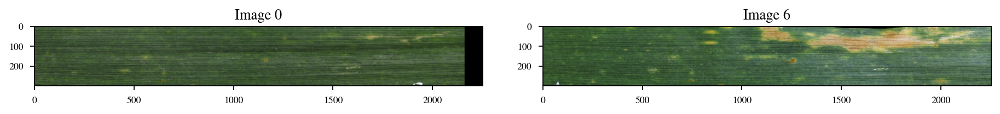

In [23]:
fix_ind = 0
# mov_ind = 1 # easy example
mov_ind = 6 # medium example
# mov_ind = 13 # hard example
PREPROCESSING_DEFAULT = {'img_scale': 'roi', 'pre_rotate': True, 'erase_markers': {'type': 'pixel_erosion', 'params': {}}}
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, **PREPROCESSING_DEFAULT)
# angle = find_roi_rotation(mask_fixed)
# out = affine_warp_expand(img_fixed, mask_fixed, rot_angle_deg=-angle)
# img_fixed = out["imgs"]
# mask_fixed = out["masks"]

img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, **PREPROCESSING_DEFAULT)
# angle = find_roi_rotation(mask_moving)
# out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-angle)
# img_moving = out["imgs"]
# mask_moving = out["masks"]
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)


In [ ]:
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
# kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
# print(f"{kpts0.shape[0]} Matches")

## Warp Consistency for TPS

### Rotation Invariance of Poor TPS Registrations

#### Rotation Utility

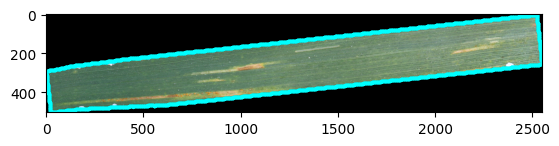

In [ ]:
from leafalignment.utils import extract_mask_boundary

out=extract_mask_boundary(mask_moving)[0]
# out = subsample_points(out)
plt.imshow(K.tensor_to_image(img_moving))
plt.scatter(out[:,0], out[:,1], c='cyan',s=2)
plt.show()

In [ ]:
import math
def sample_landmarks_grid(mask, n):
    mask = mask[0,0,:]
    H, W = mask.shape
    valid_area = torch.sum(mask)
    total_area = H * W
    coverage = valid_area / total_area
    ratio = H/W

    # points that fall outside the mask are lost -> generate more points to account for this
    N = n / coverage
    kW = math.ceil( (N/ratio)**0.5)
    kH = math.ceil(ratio*kW)
    
    xs = torch.linspace(0, W-1, kW) 
    ys = torch.linspace(0, H-1, kH)
    
    grid_x, grid_y = torch.meshgrid(xs, ys, indexing="xy")
    pts = torch.stack([grid_x.flatten(), grid_y.flatten()], dim=1)

    mask_values = mask[pts[:,1].long(), pts[:,0].long()]
    pts = pts[mask_values > 0]

    return pts[:n]

n = 500
sample_keypoints_grid = sample_landmarks_grid(mask_moving, n)

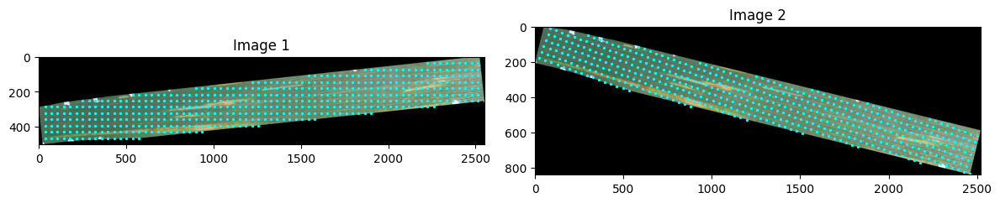

In [ ]:
from leafalignment.utils import affine_warp_expand

out = affine_warp_expand(img_moving, mask=mask_moving, pts=sample_keypoints_grid, rot_angle_deg=20, fx=0, fy=0, scale=1.0)
fig, axs =plot_image_pair(img_moving, out["img"])
axs[0].scatter(sample_keypoints_grid[:,0], sample_keypoints_grid[:,1], s=2, c='cyan')
axs[1].scatter(out["pts"][:,0], out["pts"][:,1], s=2, c='cyan')
# plt.imshow(K.tensor_to_image(out))
# plt.axis('off')
# plt.show()

In [ ]:
from leafalignment.utils import expand_affine_from_contour, affine_warp_image, affine_warp_points
def affine_warp_expand_t(img, mask: torch.Tensor=None, pts: torch.Tensor=None, rot_angle_deg=0, fx=0, fy=0, scale=1.0, return_matrix: bool=False):
    # add batch dim if necessary
    if img.dim() == 3:
        img = img.unsqueeze(0)
    
    B,C,H,W = img.shape
    device = img.device
    tx = W*fx/100
    ty = H*fy/100
    angle = torch.tensor([rot_angle_deg], dtype=img.dtype, device=img.device).repeat(B)
    scale = torch.tensor([scale, scale], dtype=img.dtype, device=img.device).repeat(B,1)
    center = torch.tensor([[img.shape[-1]/2, img.shape[-2]/2]], dtype=img.dtype, device=img.device).repeat(B,1)
    translation = torch.tensor([[tx, ty]], dtype=img.dtype, device=img.device).repeat(B,1)
    matrix = K.geometry.transform.get_affine_matrix2d(translation, center, scale, angle)


    if mask is not None:
        new_matrix, new_H, new_W = expand_affine_from_contour(matrix, mask)
    else:
        new_matrix, new_H, new_W = expand_affine_from_corners(matrix, H, W)

    if (H<new_H) or (W<new_W):
        print("Image will be expanded")
    else:
        # new_matrix = matrix
        new_H = H
        new_W = W

    output_size = (new_H,new_W)

    img_warped = affine_warp_image(img, new_matrix, output_size) #K.geometry.transform.warp_affine(img, matrix[:,:2,:], dsize=output_size)
    out_dict = {"img": img_warped}
    if mask is not None:
        mask_warped = affine_warp_image(mask, new_matrix, output_size, interpolation="nearest")
        out_dict.update({"mask": mask_warped})

    if pts is not None:
        pts_warped = affine_warp_points(pts, new_matrix)
        out_dict.update({"pts": pts_warped})

    if return_matrix:
        out_dict.update({"matrix": new_matrix})

    return out_dict

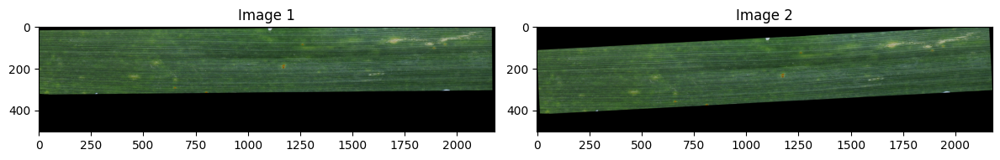

In [ ]:
out = affine_warp_expand_t(img_moving_easy, mask=mask_moving_easy, rot_angle_deg=-2.5, fx=0, fy=0, scale=1.0)
fig, axs =plot_image_pair(img_moving_easy, out["img"])
# axs[0].scatter(sample_keypoints_grid[:,0], sample_keypoints_grid[:,1], s=2, c='cyan')
# axs[1].scatter(out["pts"][:,0], out["pts"][:,1], s=2, c='cyan')
# plt.imshow(K.tensor_to_image(out))
# plt.axis('off')
# plt.show()

##### Expand for two masks

In [ ]:
# from kornia.geometry.linalg import transform_points
from leafalignment.utils import extract_mask_boundary
def expand_affine_from_joint_contour(A, masks):
    """
    A: (B,3,3)
    masks: list of masks [(B,1,H,W), ...]

    returns xmin, ymin, xmax, ymax (B,)
    """
    B = A.shape[0]
    device = A.device
    dtype = A.dtype

    xmin_all, ymin_all = [], []
    xmax_all, ymax_all = [], []

    # collect all ROI points per batch
    pts_per_batch = [[] for _ in range(B)]

    for mask in masks:
        pts_list = extract_mask_boundary(mask)
        for b in range(B):
            pts_per_batch[b].append(pts_list[b])

    for b in range(B):
        pts = torch.cat(pts_per_batch[b], dim=0)  # union of ROIs

        pts = pts.unsqueeze(0)  # (1,N,2)
        warped = K.geometry.linalg.transform_points(A[b:b+1], pts)[0]

        # save min/max in x/y dimension
        xmin_all.append(warped[:, 0].min() - 0.5)
        ymin_all.append(warped[:, 1].min() - 0.5)
        xmax_all.append(warped[:, 0].max() + 0.5)
        ymax_all.append(warped[:, 1].max() + 0.5)

    xmin = torch.stack(xmin_all)
    ymin = torch.stack(ymin_all)
    xmax = torch.stack(xmax_all)
    ymax = torch.stack(ymax_all)

    # compute height and width after transformation
    new_W = torch.ceil(xmax - xmin).to(torch.int64)
    new_H = torch.ceil(ymax - ymin).to(torch.int64)


    # create proper translation
    shift = torch.eye(3, device=device, dtype=dtype).unsqueeze(0).repeat(B, 1, 1)
    shift[:, 0, 2] = -xmin
    shift[:, 1, 2] = -ymin

    A_new = shift @ A # add translation to affine warp

    return A_new, new_H, new_W


In [ ]:
from leafalignment.utils import expand_affine_from_contour, affine_warp_image, affine_warp_points
from typing import List
def affine_warp_expand_t(imgs: torch.Tensor, masks: torch.Tensor=None, pts_list: List[torch.Tensor]=None, rot_angle_deg=0, fx=0, fy=0, scale=1.0, return_matrix: bool=False):
    # add batch dim if necessary
    if type(imgs) == torch.Tensor:
        imgs = [imgs]
    for img in imgs:
        if img.dim() == 3:
            img = img.unsqueeze(0)
    if type(masks) == torch.Tensor:
        masks = [masks]
    
    B,C,H,W = imgs[0].shape
    device = imgs[0].device
    dtype = imgs[0].dtype
    tx = W*fx/100
    ty = H*fy/100
    angle = torch.tensor([rot_angle_deg], dtype=dtype, device=device).repeat(B)
    scale = torch.tensor([scale, scale], dtype=dtype, device=device).repeat(B,1)
    center = torch.tensor([[img[0].shape[-1]/2, img[0].shape[-2]/2]], dtype=dtype, device=device).repeat(B,1)
    translation = torch.tensor([[tx, ty]], dtype=dtype, device=device).repeat(B,1)
    matrix = K.geometry.transform.get_affine_matrix2d(translation, center, scale, angle)


    if masks is not None:
        new_matrix, new_H, new_W = expand_affine_from_joint_contour(matrix, masks)
    else:
        new_matrix, new_H, new_W = expand_affine_from_corners(matrix, H, W)

    # if (H<new_H) or (W<new_W):
    #     print("Image will be expanded")
    # else:
    #     # new_matrix = matrix
    #     new_H = H
    #     new_W = W

    output_size = (new_H,new_W)

    imgs_out = []
    for img in imgs:
        imgs_out.append( affine_warp_image(img, new_matrix, output_size) )
    if len(imgs_out)==1:
        imgs_out = imgs_out[0]
    out_dict = {"imgs": imgs_out}

    if masks is not None:
        masks_out = []
        for mask in masks:
            masks_out.append( affine_warp_image(mask, new_matrix, output_size, interpolation="nearest") )
        if len(masks_out)==1:
            masks_out = masks_out[0]
        out_dict.update({"masks": masks_out})

    if pts_list is not None:
        pts_out = []
        for pts in pts_list:
            pts_out.append( affine_warp_points(pts, new_matrix) )
        if len(pts_out)==1:
            pts_out = pts_out[0]
        out_dict.update({"pts": pts_out})

    if return_matrix:
        out_dict.update({"matrix": new_matrix})

    return out_dict

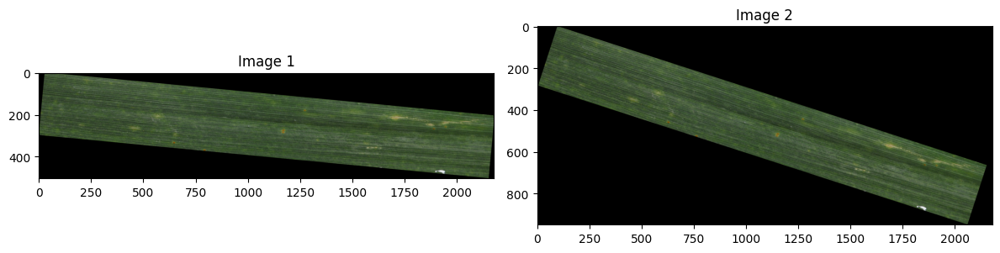

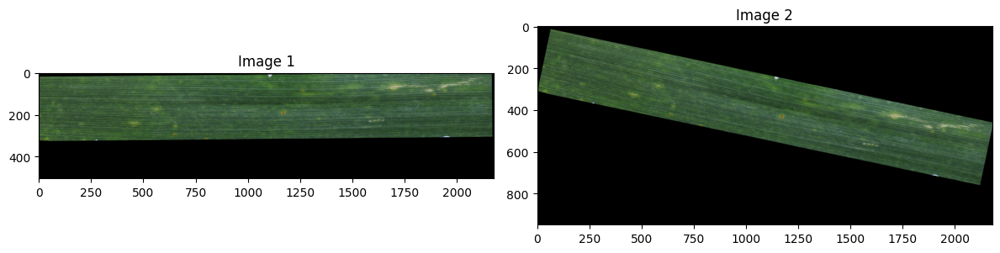

In [ ]:
out = affine_warp_expand_t([img_fixed, img_moving_easy], masks=[mask_fixed, mask_moving_easy], rot_angle_deg=12.5, fx=0, fy=0, scale=1.0)
fig, axs =plot_image_pair(img_fixed, out["imgs"][0])
fig, axs =plot_image_pair(img_moving_easy, out["imgs"][1])
# axs[0].scatter(sample_keypoints_grid[:,0], sample_keypoints_grid[:,1], s=2, c='cyan')
# axs[1].scatter(out["pts"][:,0], out["pts"][:,1], s=2, c='cyan')
# plt.imshow(K.tensor_to_image(out))
# plt.axis('off')
# plt.show()

### TPS Rotation Test

#### Wrapper Function

In [ ]:
def tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=0, fx=0, fy=0, scale=1.0, plot_warps: bool=False):
    # warp original image
    og_warped = torch_tps(kpts0, kpts1, img_moving, smoothing)

    # apply an affine transform to both images
    out = affine_warp_expand(img_moving, masks=[mask_fixed, mask_moving], pts_list=[kpts0, kpts1], rot_angle_deg=rot_angle_deg, fx=fx, fy=fy, scale=scale, return_matrix=True)
    img_rot = out["imgs"]
    kpts0_rot, kpts1_rot = out["pts"]
    mat = out["matrix"]

    # TPS transform of transformed moving image
    rot_warped = torch_tps(kpts0_rot, kpts1_rot, img_rot, smoothing)
    # if plot_warps:
    #     _=plot_image_pair(img_rot, rot_warped)

    # invert transformation for comparison
    mat_inv = torch.linalg.inv(mat)
    img_warped = affine_warp_image(rot_warped, mat_inv, img_moving.shape[2:])
    if plot_warps:
        fig, axs=plot_image_pair(og_warped, img_warped)
        axs[0].set_title("Original Moving Image, Warped")
        axs[1].set_title("Transformed Moving Image, Warped")

    # compute difference
    mse = torch.nn.functional.mse_loss(img_warped, og_warped)
    mae = torch.nn.functional.l1_loss(img_warped, og_warped)
    print(f"MSE = {mse.item():.8f}")
    print(f"MAE = {mae.item():.8f}")
    # return diff

Total matches: 498
Matches with Confidence > 0.5: 168
Inliers: 178 (35.74%)
Threshold set to 0.5
168 Matches left


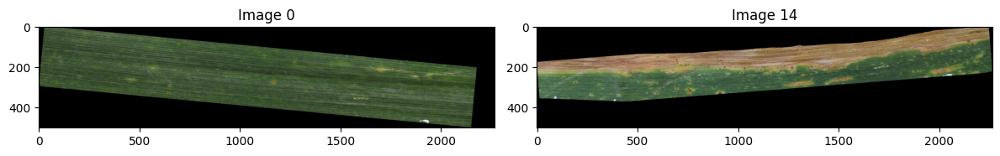

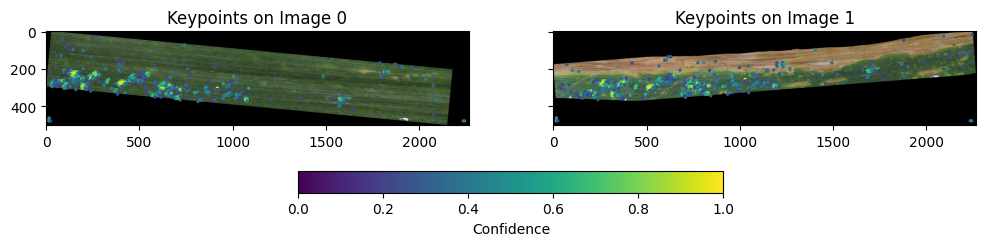

In [ ]:
fix_ind = 0
mov_ind = 14 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=True, return_n_matches=True)
_ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=True)
print(f"{kpts0.shape[0]} Matches left")

MSE = 0.00344441
MAE = 0.02412275


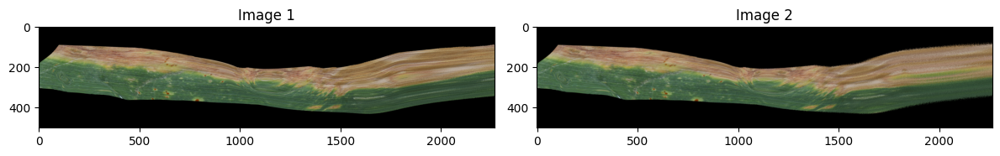

In [ ]:
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=30, fx=0, fy=0, scale=1.0, plot_warps=True)

#### Examples

In [ ]:
leaf = LeafDataset(
    base_dir='../../leaf-image-sequences',
    # leaf_uid="ESWW0070020_2",
    leaf_uid="ESWW0070040_6", # has much missing data 
    load=('roi_leaf_masks'),
    # load=('target_images', 'target_masks', 'leaf_masks', 'seg_masks', 'det_masks', 'cropped_images', 'rois', 'images', 'keypoints', 'roi_leaf_masks'),
    verbose=False
)

Processing series: 100%|██████████| 17/17 [00:04<00:00,  3.55it/s]


In [ ]:
l = []
for i in range(leaf.n_leaves):
    if leaf.roi_leaf_images[i] is not None:
        l.append(i)
print(f"Non-None Entries: {l}")

Non-None Entries: [0, 2, 3, 4, 5, 6, 7]


Failed Transform:
168 Matches


MSE = 0.00344441
MAE = 0.02412275


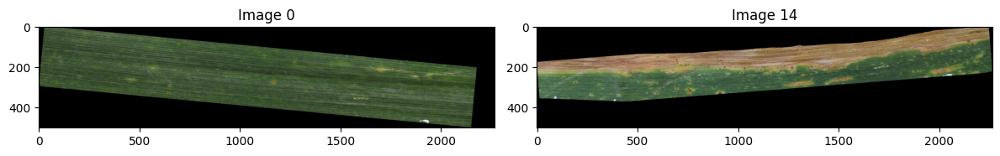

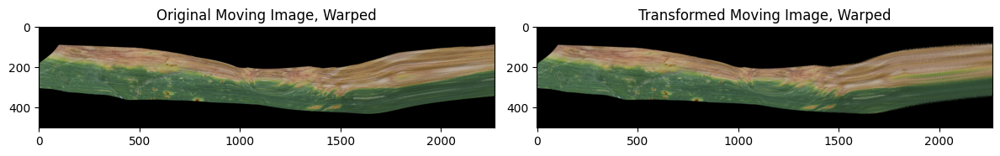

In [ ]:
print("Failed Transform:")
fix_ind = 0
mov_ind = 14 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=30, fx=0, fy=0, scale=1.0, plot_warps=True)

Reasonable Transform with poor scores:
455 Matches
MSE = 0.00141539
MAE = 0.01428040


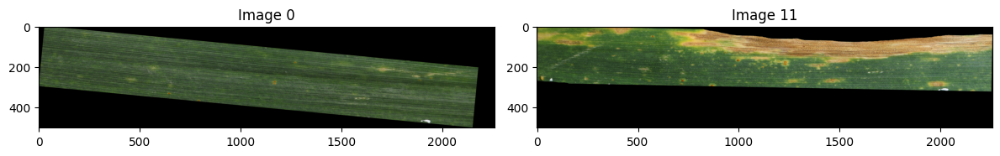

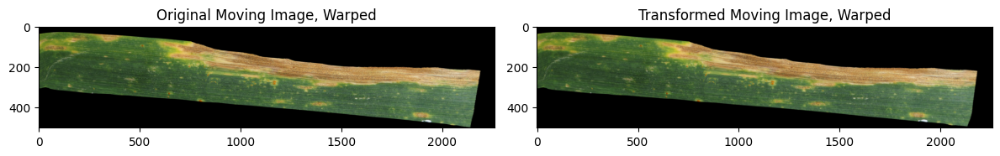

In [ ]:
print("Reasonable Transform with poor scores:")
fix_ind = 0
mov_ind = 11 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=30, fx=0, fy=0, scale=1.0, plot_warps=True)

Successful Transform:


436 Matches
MSE = 0.00027874
MAE = 0.00900803


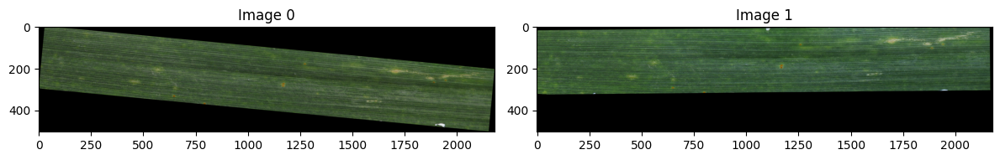

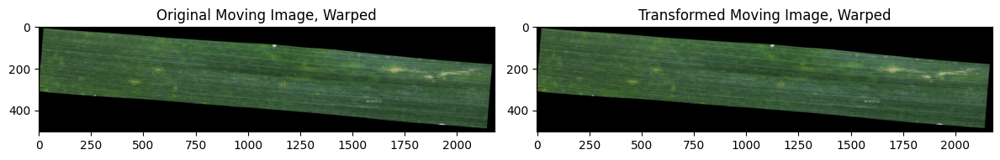

In [ ]:
print("Successful Transform:")
fix_ind = 0
mov_ind = 1 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=30, fx=0, fy=0, scale=1.0, plot_warps=True)

Failed Transform but with excellent scores:


15 Matches
MSE = 0.00021286
MAE = 0.00331491


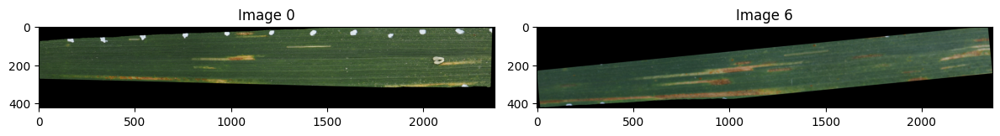

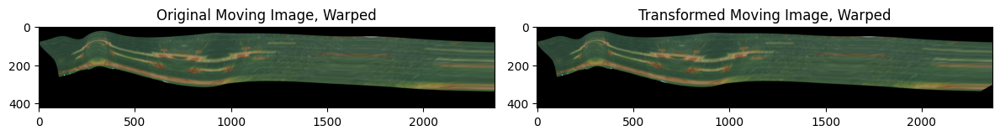

In [ ]:
print("Failed Transform but with excellent scores:")
fix_ind = 0
mov_ind = 6 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=30, fx=0, fy=0, scale=1.0, plot_warps=True)

Failed Transform with visible difference:
387 Matches
MSE = 0.00523142
MAE = 0.03056534


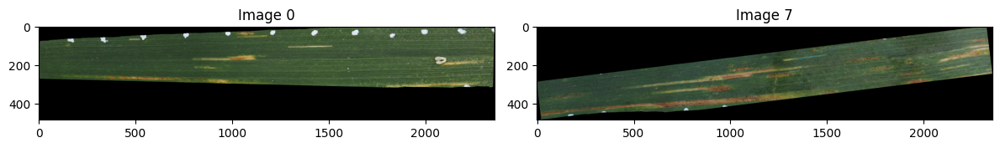

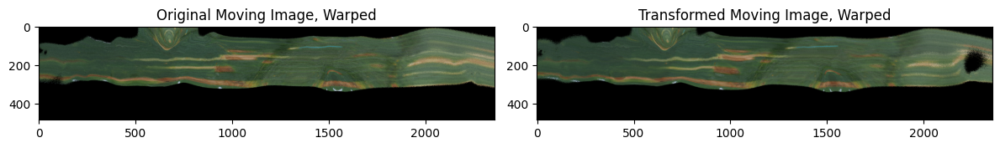

In [ ]:
print("Failed Transform with visible difference:")
fix_ind = 0
mov_ind = 7 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)
# _ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_warp_consistency(kpts0, kpts1, img_moving, mask_fixed, mask_moving, smoothing=0.0, rot_angle_deg=90, fx=0, fy=0, scale=1.0, plot_warps=True)

## Ransac for TPS

### RANSAC Function

In [ ]:
from leafalignment.metrics import mse_masked, mape_masked, local_ncc_masked, nmi_masked, ssim_masked, iou, hausdorff
metrics = {'MSE': mse_masked, 'MAPE': mape_masked, 'NCC': local_ncc_masked, 'MI': nmi_masked, 'SSIM': ssim_masked, 'IoU': iou, 'Hausdorff': hausdorff}
import warnings
warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    module="monai"
)

def tps_ransac(img_moving, mask_moving, kpts_fixed, kpts_moving, n_rep=10, discard_ratio=0.25, n_keep_max=None, smoothing=0.0, logging=False, logging_file='results/ransac_metrics.csv', keypoint_type=None, difficulty=None, fault_present=None, moving_idx=None):
    
    # compute full transform + warp
    tps = fit_tps_torch(kpts_fixed, kpts_moving, alpha=smoothing)
    img_warped_out = warp_tps_torch(tps, img_moving)
    mask_warped_out = warp_tps_torch(tps, mask_moving)
    
    n = kpts_fixed.shape[0]
    n_keep = int((1-discard_ratio)*n)
    if n_keep_max is None:
        n_keep_max = int((1-discard_ratio)*n)
        n_keep = max(n_keep, n_keep_max)
    # elif n_keep >= n:
        


    imgs_warped = []
    masks_warped = []
    
    for _ in range(n_rep):
        ind = torch.randperm(n)[:n_keep]
        kpts_fixed_subset = kpts_fixed[ind]
        kpts_moving_subset = kpts_moving[ind]

        tps = fit_tps_torch(kpts_fixed_subset, kpts_moving_subset, alpha=smoothing)
        img_warped = warp_tps_torch(tps, img_moving).squeeze(0)
        imgs_warped.append(img_warped)
        # mask_warped = warp_tps_torch(tps, mask_moving)
        # imgs_warped.append(warp_tps_torch(tps, img_moving))
        masks_warped.append(warp_tps_torch(tps, mask_moving).squeeze(0))

        _=plot_image_pair(img_warped_out, img_warped, img1_ind="Full Warp", img2_ind="RANSAC Warp")

    imgs_warped = torch.stack(imgs_warped) 
    masks_warped = torch.stack(masks_warped)

    if logging:
        with open(logging_file, 'a', newline='') as f:
            metric_labels = [metric + '_' + stat for metric in list(metrics.keys()) for stat in ['mean', 'std']]
            writer = csv.DictWriter(f, fieldnames=['difficulty', 'keypoint_type', 'fault_present', 'moving_idx']+metric_labels)
            
            # write header only if file is new
            if f.tell() == 0:
                writer.writeheader()

            eval_res = {'difficulty': difficulty, 'keypoint_type': keypoint_type, 'fault_present': fault_present, 'moving_idx': moving_idx}

            # i, j = torch.triu_indices(n_rep, n_rep, offset=1)  # upper triangle, no diagonal
            for metric_name, metric_func in metrics.items():
                values = torch.stack([
                    metric_func(img_warped_out, mask_warped_out, imgs_warped[i].unsqueeze(0), masks_warped[i].unsqueeze(0))
                    for i in range(n_rep)
                ])
                # print("-----------------")
                # print(f"{metric_name} mean = {values.mean()}")
                # print(f"{metric_name} std = {values.std()}")
                eval_res.update({metric_name+'_mean': values.mean().item(), metric_name+'_std': values.std().item()}) 
            
            writer.writerow(eval_res) 

    else:
        i, j = torch.triu_indices(n_rep, n_rep, offset=1)  # upper triangle, no diagonal
        for metric_name, metric_func in metrics.items():
            values = torch.stack([
                metric_func(imgs_warped[a].unsqueeze(0), masks_warped[a].unsqueeze(0), imgs_warped[b].unsqueeze(0), masks_warped[b].unsqueeze(0))
                for a, b in zip(i, j)
            ])
            print("-----------------")
            print(f"{metric_name} mean = {values.mean()}")
            print(f"{metric_name} std = {values.std()}")

        


    # # if metrics support batches (they don't currently)
    # i, j = torch.triu_indices(n_rep, n_rep, offset=1)
    # for metric_name, metric_func in metrics.items():
    #     imgs_a = imgs_warped[i]  # shape: [num_pairs, C, H, W]
    #     masks_a = masks_warped[i]  
    #     imgs_b = imgs_warped[j]
    #     masks_b = masks_warped[j]

    #     values = metric_func(imgs_a, masks_a, imgs_b, masks_b)  # should return [num_pairs]
    #     print("-----------------")
    #     print(f"{metric_name} mean = {values.mean()}")
    #     print(f"{metric_name} std = {values.std()}")

    return img_warped_out, mask_warped_out

#### Unfiltered keypoints

-----------------
MSE mean = 0.003605787642300129
MSE std = 0.0001293213717872277
-----------------
MAPE mean = 41.76677322387695
MAPE std = 1.8721073865890503
-----------------
NCC mean = 0.1119307205080986
NCC std = 0.018306082114577293
-----------------
MI mean = 1.0367637872695923
MI std = 0.001741404877975583
-----------------
SSIM mean = 0.3936110734939575
SSIM std = 0.010460708290338516
-----------------
IoU mean = 0.9855169653892517
IoU std = 0.0016986803384497762


/layers/paketo-buildpacks_conda-env-update/conda-env/lib/python3.13/site-packages/monai/utils/deprecate_utils.py:221: FutureWarning: monai.metrics.utils get_mask_edges:always_return_as_numpy: Argument `always_return_as_numpy` has been deprecated since version 1.5.0. It will be removed in version 1.7.0. The option is removed and the return type will always be equal to the input type.
  warn_deprecated(argname, msg, warning_category)


-----------------
Hausdorff mean = 61.67732620239258
Hausdorff std = 18.480022430419922


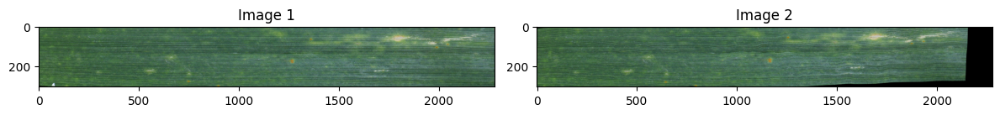

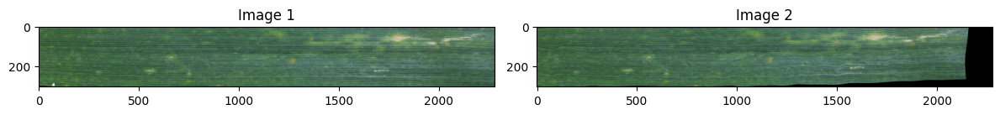

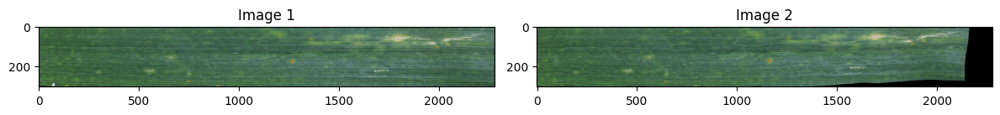

In [11]:
# easy transform, unfiltered keypoints
tps_ransac(img_moving, mask_moving, mkpts0, mkpts1, n_rep=3, discard_ratio=0.25, n_keep=500, smoothing=0.0)

-----------------
MSE mean = 0.008580501191318035
MSE std = 0.0005375237669795752
-----------------
MAPE mean = 621.6871948242188
MAPE std = 990.5029296875
-----------------
NCC mean = 0.044492363929748535
NCC std = 0.02055477164685726
-----------------
MI mean = 1.0658435821533203
MI std = 0.0059740846045315266
-----------------
SSIM mean = 0.2922975718975067
SSIM std = 0.01390843465924263
-----------------
IoU mean = 0.9406723976135254
IoU std = 0.01073908619582653
-----------------
Hausdorff mean = 73.92961883544922
Hausdorff std = 22.45256805419922


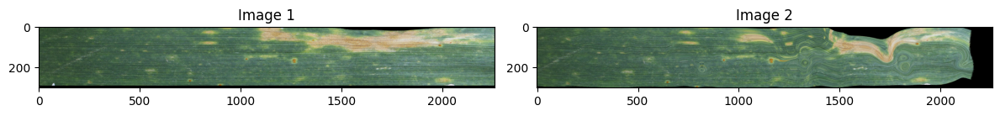

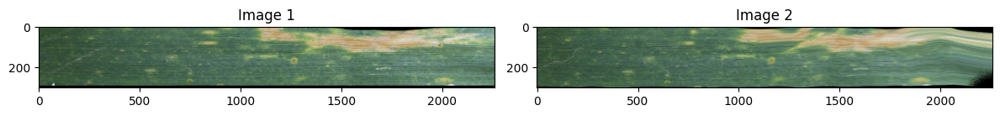

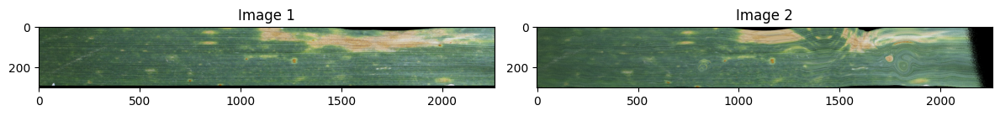

In [24]:
# medium transform, unfiltered keypoints
tps_ransac(img_moving, mask_moving, mkpts0, mkpts1, n_rep=3, discard_ratio=0.25, n_keep=500, smoothing=0.0)

-----------------
MSE mean = 0.010449777357280254
MSE std = 0.0005628300132229924
-----------------
MAPE mean = 53.550777435302734
MAPE std = 1.591239094734192
-----------------
NCC mean = 0.03284917399287224
NCC std = 0.00846383348107338
-----------------
MI mean = 1.0553746223449707
MI std = 0.0028813823591917753
-----------------
SSIM mean = 0.24076135456562042
SSIM std = 0.013208122923970222
-----------------
IoU mean = 0.9543375968933105
IoU std = 0.009351072832942009
-----------------
Hausdorff mean = 48.872310638427734
Hausdorff std = 13.007554054260254


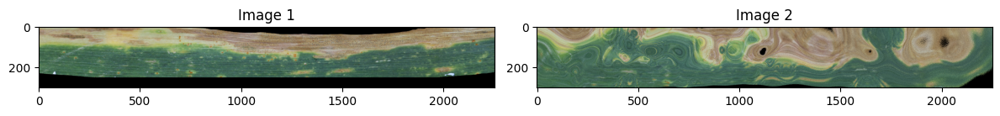

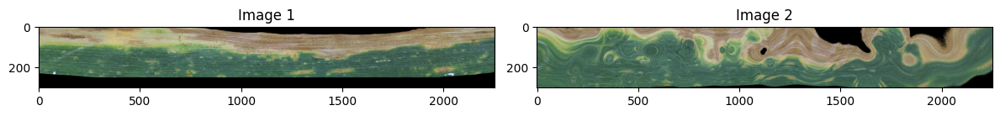

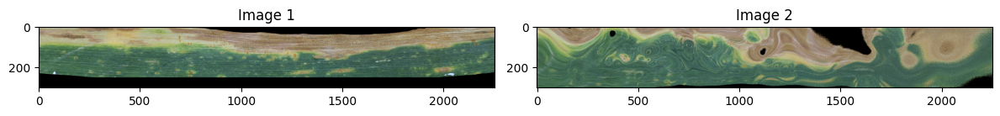

In [13]:
# difficult transform, unfiltered keypoints
tps_ransac(img_moving, mask_moving, mkpts0, mkpts1, n_rep=3, discard_ratio=0.25, n_keep=500, smoothing=0.0)

#### Keypoints filtered by Confidence

394 Matches
-----------------
MSE mean = 0.003474801778793335
MSE std = 0.000502469134517014
-----------------
MAPE mean = 40.62089538574219
MAPE std = 5.746220111846924
-----------------
NCC mean = 0.1973562240600586
NCC std = 0.08179199695587158
-----------------
MI mean = 1.0396513938903809
MI std = 0.007321944460272789
-----------------
SSIM mean = 0.44214507937431335
SSIM std = 0.056551072746515274
-----------------
IoU mean = 0.9631927609443665
IoU std = 0.005088112782686949
-----------------
Hausdorff mean = 15.131558418273926
Hausdorff std = 0.23224174976348877


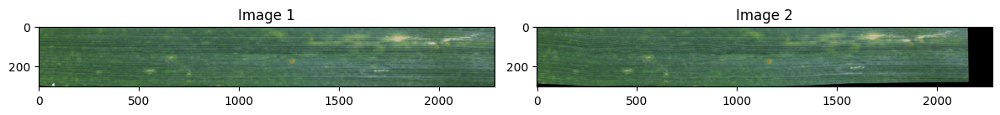

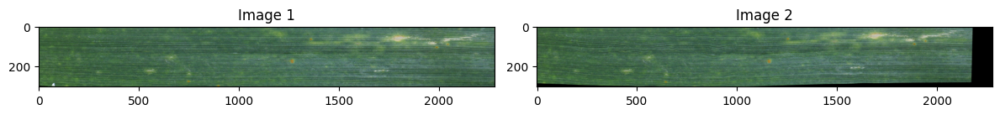

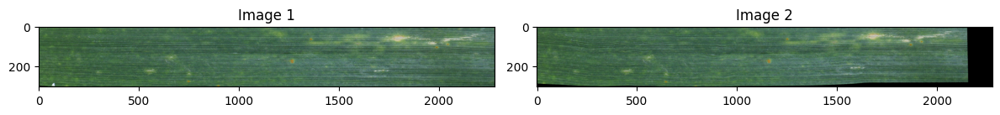

In [26]:
# easy transform, filtered keypoints
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='confident', difficulty='easy', moving_idx=mov_ind)

415 Matches
-----------------
MSE mean = 0.0031251751352101564
MSE std = 0.0009313254849985242
-----------------
MAPE mean = 29.080419540405273
MAPE std = 3.7056524753570557
-----------------
NCC mean = 0.3212203085422516
NCC std = 0.1106019914150238
-----------------
MI mean = 1.1306952238082886
MI std = 0.01624753698706627
-----------------
SSIM mean = 0.5521405339241028
SSIM std = 0.07655264437198639
-----------------
IoU mean = 0.9606989026069641
IoU std = 0.0069746472872793674
-----------------
Hausdorff mean = 13.98178768157959
Hausdorff std = 0.8743076324462891


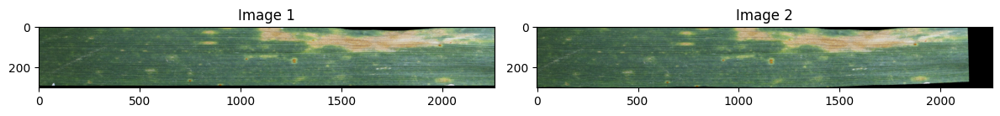

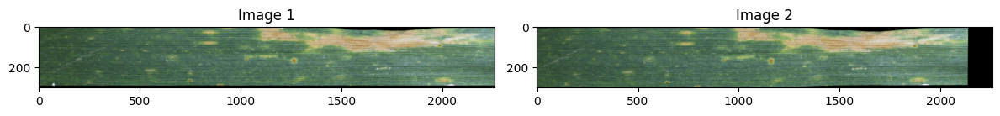

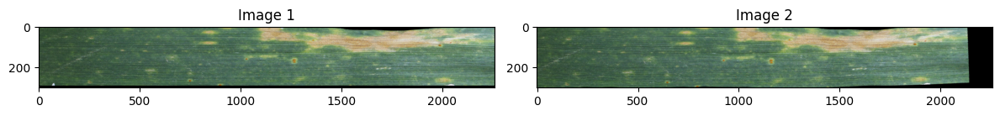

In [29]:
# medium transform, filtered keypoints
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='confident', difficulty='medium', moving_idx=mov_ind)

283 Matches


-----------------
MSE mean = 0.005995165091007948
MSE std = 0.00270151998847723
-----------------
MAPE mean = 38.07705307006836
MAPE std = 8.189841270446777
-----------------
NCC mean = 0.21902208030223846
NCC std = 0.06131599843502045
-----------------
MI mean = 1.1072163581848145
MI std = 0.027383629232645035
-----------------
SSIM mean = 0.5098763704299927
SSIM std = 0.07170478999614716
-----------------
IoU mean = 0.9081479907035828
IoU std = 0.050894517451524734
-----------------
Hausdorff mean = 32.5894889831543
Hausdorff std = 20.877931594848633


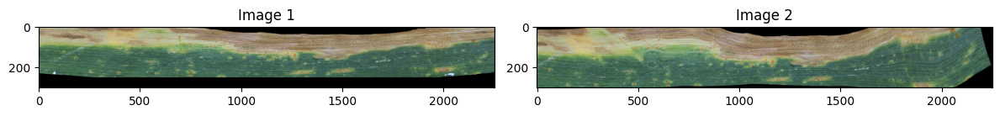

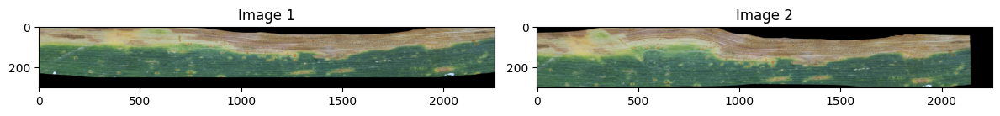

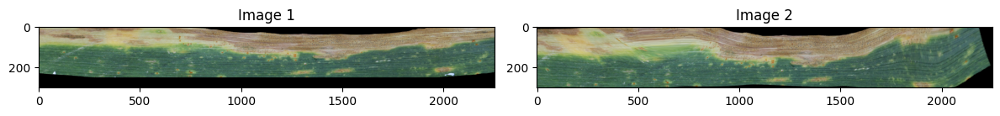

In [32]:
# difficult transform, filtered keypoints
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence, threshold=0.5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='confident', difficulty='difficult', moving_idx=mov_ind)

#### Only Consistent Keypoints

In [ ]:
from leafalignment.utils import affine_warp_expand
from leafalignment.loftr import loftr_match, cycle_matches, plot_cycle_matches
from leafalignment.plotting import plot_match_coverage
def warp_consistency(img_fixed, img_moving, mask_moving, plot_matches: bool=False, rotation=-10, tolerance=50, verbose: bool=False):

    img1 = img_fixed
    img2 = img_moving
    img2_mask = mask_moving
    # img3 =  hom.warp_image(img_moving)
    out = affine_warp_expand(img2, img2_mask, rot_angle_deg=rotation)
    img3 = out["imgs"]

    if verbose:
        print(f"Detecting LoFTR Matches...")
    # 1 -> 2
    mkpts12_1, mkpts12_2, confidence_12, _,= loftr_match(img1, img2, verbose=verbose, return_n_matches=False)
    # 2 -> 3
    mkpts23_2, mkpts23_3, confidence_23, _,= loftr_match(img2, img3, verbose=verbose, return_n_matches=False)
    # 3 -> 1
    # mkpts31_3, mkpts31_1, confidence_31, _,= loftr_match(img3, img1, verbose=verbose, return_n_matches=False)
    mkpts13_1, mkpts13_3, confidence_13, _ = loftr_match(img1, img3, verbose=verbose, return_n_matches=False)
    if verbose:
        print(f"Img1 -> Img2: {len(mkpts12_1)} Matches")
        print(f"Img2 -> Img3: {len(mkpts23_2)} Matches")
        print(f"Img3 -> Img1: {len(mkpts31_3)} Matches")

    if plot_matches:
        _ = plot_match_coverage(img1, mkpts12_1, img2, mkpts12_2, confidence_12)
        _ = plot_match_coverage(img2, mkpts23_2, img3, mkpts23_3, confidence_23)
        # _ = plot_match_coverage(img3, mkpts31_3, img1, mkpts31_1, confidence_31)
        _ = plot_match_coverage(img3, mkpts13_3, img1, mkpts13_1, confidence_13)


    if plot_matches:
        # cycled_31_1, nn_ind_2, nn_ind_3 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1, return_indices=True)
        # plot_cycle_matches(img1, img2, img3, mkpts12_1, mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1, nn_ind_2, nn_ind_3, N_show=30)
        cycled_31_1, nn_ind_2, nn_ind_3 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1, return_indices=True)
        plot_cycle_matches(img1, img2, img3, mkpts12_1, mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1, nn_ind_2, nn_ind_3, N_show=30)
    else:
        # cycled_31_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts31_3, mkpts31_1)
        cycled_31_1 = cycle_matches(mkpts12_2, mkpts23_2, mkpts23_3, mkpts13_3, mkpts13_1)
    dists = torch.norm(mkpts12_1 - cycled_31_1, dim=1)
    is_consistent = (dists < tolerance)

    if plot_matches:
        print(f"Number of consistent matches: {int(is_consistent.sum())}")
        print(f"Ratio of consistent matches: {is_consistent.to(torch.float32).mean():.3f}")
        print(f"Least confident of consistent matches: {confidence_12[is_consistent].min():.3f}")
        _ = plot_match_coverage(img1, mkpts12_1[is_consistent], img2, mkpts12_2[is_consistent], confidence_12[is_consistent])
        # _ = plot_match_coverage(img1, cycled_31_1[is_consistent], img1, mkpts12_1[is_consistent], is_consistent[is_consistent])

    return mkpts12_1[is_consistent], mkpts12_2[is_consistent], confidence_12[is_consistent]


4427 Matches
-----------------
MSE mean = 0.0035466544795781374
MSE std = 4.751534288516268e-05
-----------------
MAPE mean = 41.244266510009766
MAPE std = 0.5562030673027039
-----------------
NCC mean = 0.14086972177028656
NCC std = 0.013534155674278736
-----------------
MI mean = 1.0374382734298706
MI std = 0.0003987782693002373
-----------------
SSIM mean = 0.40956592559814453
SSIM std = 0.009988405741751194
-----------------
IoU mean = 0.9855368733406067
IoU std = 0.001956004649400711
-----------------
Hausdorff mean = 45.380550384521484
Hausdorff std = 4.645984649658203


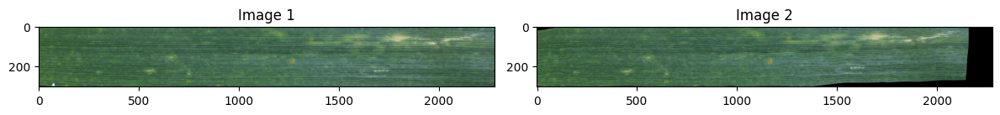

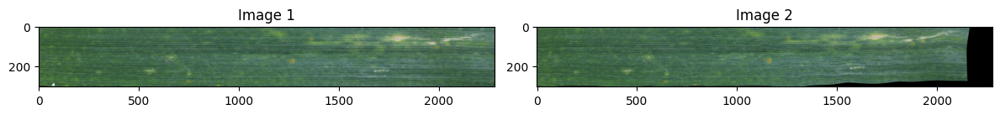

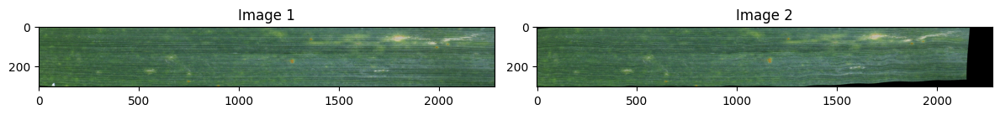

In [27]:
# easy transform, consistent keypoints
kpts0, kpts1, _ = warp_consistency(img_fixed, img_moving, mask_moving, plot_matches=False, rotation=-10, tolerance=5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, n_keep=500, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='consistent', difficulty='easy', moving_idx=mov_ind)

1269 Matches
-----------------
MSE mean = 0.0044983490370213985
MSE std = 0.0003914329572580755
-----------------
MAPE mean = 36.963592529296875
MAPE std = 1.706032395362854
-----------------
NCC mean = 0.1326167732477188
NCC std = 0.028433984145522118
-----------------
MI mean = 1.0977427959442139
MI std = 0.004410444293171167
-----------------
SSIM mean = 0.38728275895118713
SSIM std = 0.043310441076755524
-----------------
IoU mean = 0.9721253514289856
IoU std = 0.010647200979292393
-----------------
Hausdorff mean = 44.3484001159668
Hausdorff std = 25.35991668701172


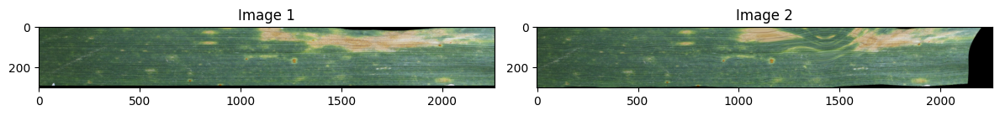

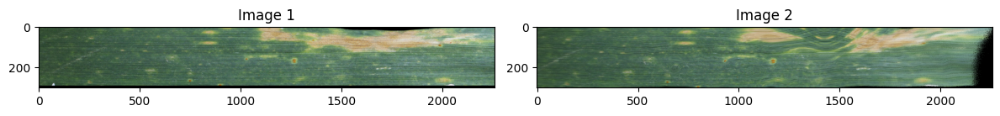

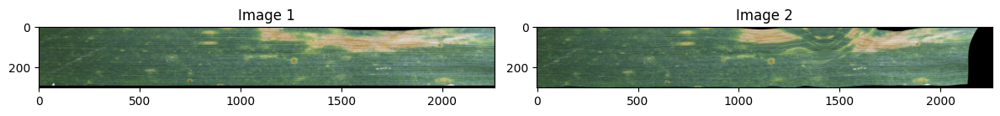

In [30]:
# medium transform, consistent keypoints
kpts0, kpts1, _ = warp_consistency(img_fixed, img_moving, mask_moving, plot_matches=False, rotation=-10, tolerance=5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, n_keep=500, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='consistent', difficulty='medium', moving_idx=mov_ind)

137 Matches
-----------------
MSE mean = 0.011497934348881245
MSE std = 0.002456416143104434
-----------------
MAPE mean = 51.44212341308594
MAPE std = 7.125643253326416
-----------------
NCC mean = 0.10424810647964478
NCC std = 0.06173918396234512
-----------------
MI mean = 1.0648502111434937
MI std = 0.01704905554652214
-----------------
SSIM mean = 0.377742201089859
SSIM std = 0.04983218386769295
-----------------
IoU mean = 0.8923109173774719
IoU std = 0.0071292659267783165
-----------------
Hausdorff mean = 27.367164611816406
Hausdorff std = 5.835872173309326


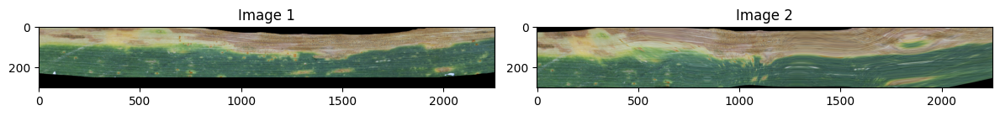

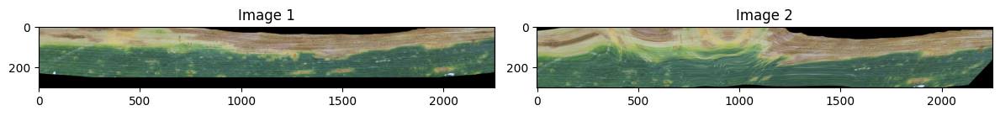

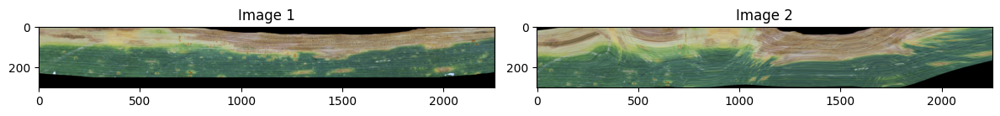

In [33]:
# difficult transform, consistent keypoints
kpts0, kpts1, _ = warp_consistency(img_fixed, img_moving, mask_moving, plot_matches=False, rotation=-10, tolerance=5, verbose=False)
print(f"{kpts0.shape[0]} Matches")
tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=3, discard_ratio=0.25, smoothing=0.0, logging=True, logging_file='results/ransac_metrics.csv', keypoint_type='consistent', difficulty='difficult', moving_idx=mov_ind)

### Finding a Criterion

In [ ]:
import time
from leafalignment.loftr import filter_matches_by_min_distance, filter_matches_by_grid, filter_matches_by_cluster

In [64]:
def plot_grid(img, cell_size=40):
    if type(img) == torch.Tensor:
        img = K.tensor_to_image(img)


    height, width = img.shape[:2]

    n_cols = math.ceil(width / cell_size)
    n_rows = math.ceil(height / cell_size)
    total_cells = n_rows * n_cols

    fig, ax = plt.subplots()
    ax.imshow(img)

    # Vertical lines
    for x in range(0, width, cell_size):
        ax.axvline(x=x, color='red', alpha=0.5, linewidth=1)

    # Horizontal lines
    for y in range(0, height, cell_size):
        ax.axhline(y=y, color='red', alpha=0.5, linewidth=1)
    
    ax.set_title(f"{total_cells} Cells")

    # plt.show()
    return fig, ax
def filter_matches_by_grid(mkpts0, mkpts1, confidence, img_width, img_height, threshold: float=0.5, n_cells: int=500, cell_size: int=50):
    if n_cells is not None:
        cell_size = math.sqrt((img_width * img_height) / n_cells)

        # convert to integer grid
        cols = int(img_width // cell_size)
        rows = int(img_height // cell_size)

        # recompute exact square size to fit in image
        cell_size = min(img_width / cols, img_height / rows)  
        # print(cell_size)  
    
    
    num_cell_per_row =  math.ceil(img_width / cell_size)
    

    cell_x = mkpts0[:,0] // cell_size
    cell_y = mkpts0[:,1] // cell_size
    cell_id = cell_y * num_cell_per_row + cell_x

    # get indices of max per cell
    cell_max_indices = group_by_argmax(confidence, cell_id.long())

    cell_max_coord0 = mkpts0[cell_max_indices, :]
    cell_max_coord1 = mkpts1[cell_max_indices, :]

    if threshold is not None:
        cell_max_coord0 = cell_max_coord0[confidence[cell_max_indices] > threshold]
        cell_max_coord1 = cell_max_coord1[confidence[cell_max_indices] > threshold]
    return cell_max_coord0, cell_max_coord1, cell_size

In [ ]:
n_cells=1000
threshold=0.0
cell_matches_fix, cell_matches_mov, cell_size = filter_matches_by_grid(mkpts0, mkpts1, confidence, img_width=img_fixed.shape[3], img_height=img_fixed.shape[2], n_cells=n_cells, threshold=threshold)
print(f"Number of Matches: {cell_matches_fix.shape[0]}")
fig, ax = plot_grid(img_fixed, int(cell_size))
ax.scatter(cell_matches_fix[:, 0], cell_matches_fix[:, 1], color='cyan', s=1)
fig.show()
fig, ax = plot_grid(img_moving, int(cell_size))
ax.scatter(cell_matches_mov[:, 0], cell_matches_mov[:, 1], color='cyan', s=1) # matches won't be neatly subdivided by cell in moving image anymore, since leaf changes
fig.show()

Warp Consistency: 12.3488s
106 Matches
106 Matches
RANSACing: 5.8639s
Total Time: 18.2131s


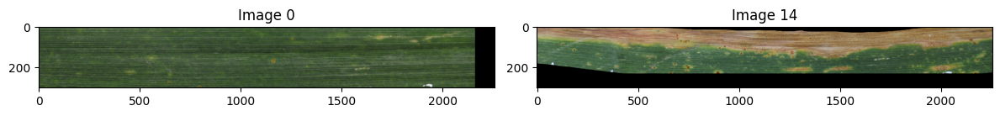

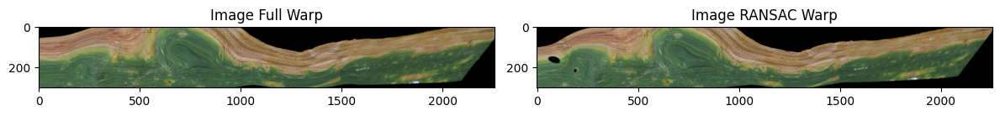

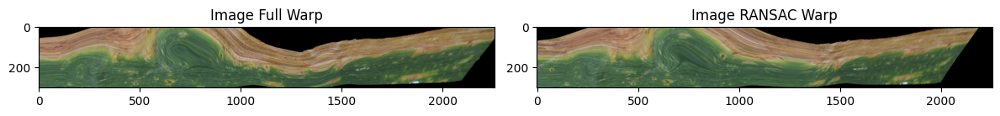

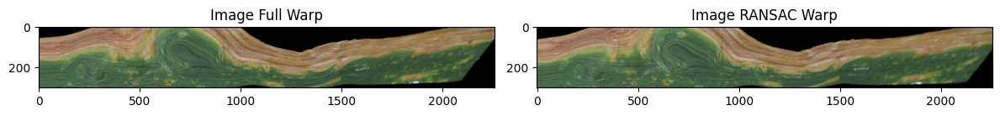

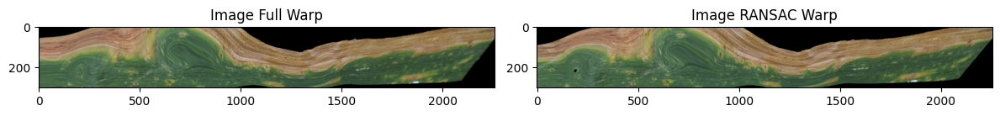

...

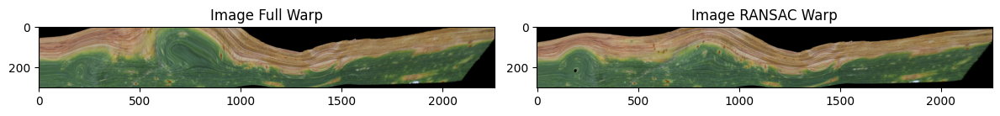

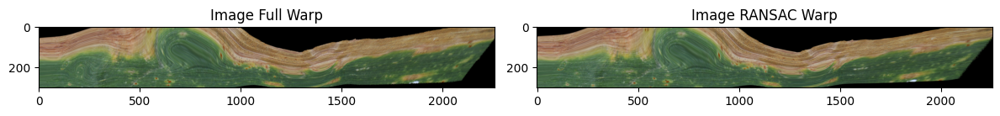

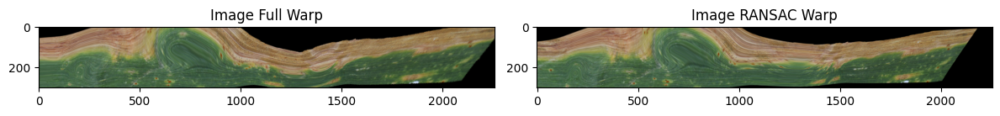

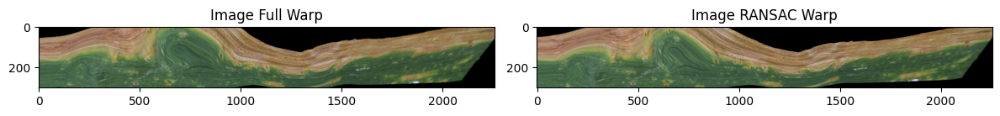

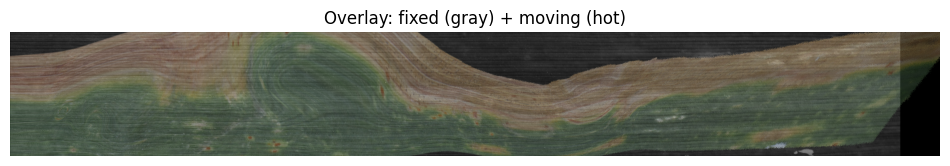

In [115]:
fix_ind = 0
mov_ind = 14
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
angle = find_roi_rotation(mask_fixed)
out = affine_warp_expand(img_fixed, mask_fixed, rot_angle_deg=-angle)
img_fixed = out["imgs"]
mask_fixed = out["masks"]

img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
angle = find_roi_rotation(mask_moving)
out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-angle)
img_moving = out["imgs"]
mask_moving = out["masks"]
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)

# medium transform, consistent keypoints
start1 = time.time()
kpts0, kpts1, confidence_consistent = warp_consistency(img_fixed, img_moving, mask_moving, plot_matches=False, rotation=-10, tolerance=5, verbose=False)

end1 = time.time()
print(f"Warp Consistency: {end1 - start1:.4f}s")
print(f"{kpts0.shape[0]} Matches")

threshold = 0.3
# kpts0, kpts1 = filter_matches_by_grid(kpts0, kpts1, confidence_consistent, img_width=img_fixed.shape[3], cell_size=cell_size, threshold=threshold)
n_clusters = 500
# kpts0, kpts1 = filter_matches_by_cluster(kpts0, kpts1, confidence_consistent, n_clusters=n_clusters, threshold=threshold)
# kpts0, kpts1 = filter_matches_by_confidence(kpts0, kpts1, confidence_consistent, threshold=0.5, verbose=False)

# filter by min_dist
# min_dist = 20
# max_points=500
# threshold=0.0
# kpts0, kpts1 = filter_matches_by_min_distance(kpts0, kpts1, confidence_consistent, min_dist=min_dist, max_points=max_points, threshold=threshold)

print(f"{kpts0.shape[0]} Matches")


start2 = time.time()
img_out, mask_out = tps_ransac(img_moving, mask_moving, kpts0, kpts1, n_rep=10, discard_ratio=0.25, n_keep_max=500, smoothing=0.0, logging=True, logging_file='results/ransac_metrics2.csv', keypoint_type='cluster', difficulty='hard', fault_present=True, moving_idx=mov_ind)
end2 = time.time()
print(f"RANSACing: {end2 - start2:.4f}s")
print(f"Total Time: {end2 - start1:.4f}s")
_=plot_overlay(img_fixed, img_out)

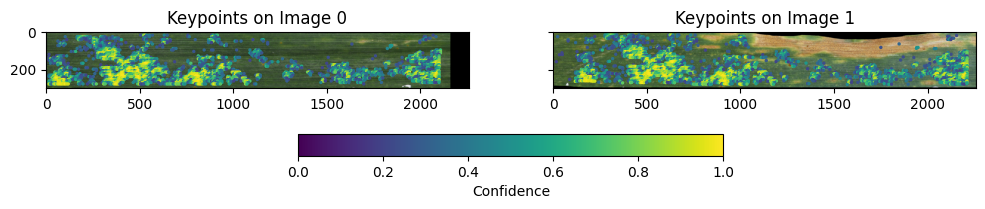

In [88]:
_=plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)

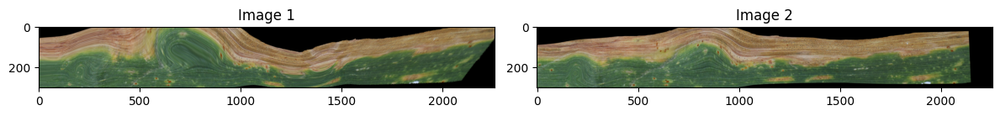

In [ ]:

full_warp = torch_tps(kpts0, kpts1, img_moving, alpha=0.0, verbose=False)
ind = torch.randperm(len(kpts0))[:50]
kpts_fixed_subset = kpts0[ind]
kpts_moving_subset = kpts1[ind]

tps = fit_tps_torch(kpts_fixed_subset, kpts_moving_subset, alpha=0.0)
partial_warp = warp_tps_torch(tps, img_moving)


fig, ax =plot_image_pair(full_warp, partial_warp)

# res = local_ncc(fixed, moving, reduction='none')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.071751].


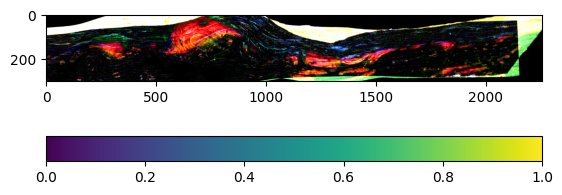

In [ ]:
from leafalignment.metrics import local_ncc, mse
# res = local_ncc(full_warp, partial_warp, reduction='none', window_size=11)
res = mse(full_warp, partial_warp, reduction='none')*10
img = plt.imshow(K.tensor_to_image(res))
plt.colorbar(img, orientation='horizontal', fraction=.1)
plt.show()

In [36]:
def color_bool(val):
    if val is True:
        return "background-color: #f28b82"   # light red
    elif val is False:
        return "background-color: #81c995"
    return ""

# df.style.map(color_bool, subset=["your_bool_column"])

In [87]:
import pandas as pd
df = pd.read_csv("results/ransac_metrics2.csv")
# lower_better = ["MSE_mean","MSE_std","MAPE_mean","MAPE_std","NCC_std","MI_std","SSIM_std","IoU_std","Hausdorff_mean","Hausdorff_std"]
# higher_better = ["NCC_mean","MI_mean","SSIM_mean","IoU_mean"]
lower_better = ["MSE_mean","MSE_std","NCC_std","SSIM_std"]
higher_better = ["NCC_mean","SSIM_mean",]

# df[df.keypoint_type =="confidence"].sort_values(by=["keypoint_type", "moving_idx"]) \
df.sort_values(by=["keypoint_type", "moving_idx"]) \
    .drop(columns=["MAPE_mean", "MAPE_std", "MI_mean", "MI_std", "IoU_mean", "IoU_std", "Hausdorff_mean", "Hausdorff_std"]) \
    .style.background_gradient(subset=higher_better, cmap="RdYlGn") \
    .background_gradient(subset=lower_better, cmap="RdYlGn_r") \
    .map(color_bool, subset=["fault_present"])
    

,difficulty,keypoint_type,fault_present,moving_idx,MSE_mean,MSE_std,NCC_mean,NCC_std,SSIM_mean,SSIM_std
23,easy,cluster,False,3,0.001046,0.000166,0.610259,0.050253,0.768370,0.027497
24,easy,cluster,False,4,0.001516,0.000165,0.600449,0.034054,0.721478,0.021805
25,medium,cluster,True,5,0.001831,0.000270,0.586872,0.029598,0.727033,0.019188
26,medium,cluster,True,6,0.001983,0.000362,0.550327,0.045527,0.686134,0.032410
27,medium,cluster,False,7,0.002200,0.000241,0.449513,0.033341,0.630482,0.023664
28,hard,cluster,True,8,0.002240,0.000163,0.324735,0.042656,0.570649,0.023924
29,hard,cluster,True,9,0.003270,0.000693,0.260512,0.040292,0.503576,0.024687
11,easy,confidence,False,3,0.001971,0.000379,0.379943,0.058225,0.615633,0.040624
12,easy,confidence,False,4,0.002791,0.000251,0.357980,0.060611,0.551058,0.039869
19,easy,confidence,False,4,0.002889,0.000303,0.324943,0.057702,0.527118,0.039095


## Keypoint Coverage

In [ ]:
plt.style.use('seaborn-v0_8-paper')

plt.rcParams.update({
    "figure.dpi": 160,
    # "font.size": 26,
    'mathtext.fontset': 'stix',
    'font.family': 'STIXGeneral',
    # "axes.spines.top": False,
    # "axes.spines.right": False,
    "axes.grid": False,
    # "grid.alpha": 0.15,
    # "lines.linewidth": 2,
})

In [24]:
config = load_config()

out = fetch_keypoints(
    img_fixed,
    img_moving, 
    mask_fixed,
    mask_moving,
    warp_consistency=config['warp_consistency'],
    match_filtering=config['match_filtering'],
    verbose=True
)

mkpts0 = out['mkpts0']
mkpts1 = out['mkpts1']
confidence = out['confidence']

Detecting LoFTR Matches...
Total matches: 4760
Matches with Confidence > 0.5: 3308
Inliers: 2382 (50.04%)
Total matches: 8627
Matches with Confidence > 0.5: 7230
Inliers: 3719 (43.11%)
Total matches: 3059
Matches with Confidence > 0.5: 1676
Inliers: 1263 (41.29%)
Img1 -> Img2: 4760 Matches
Img2 -> Img3: 8627 Matches
Img3 -> Img1: 3059 Matches
Number of consistent matches: 1748
Ratio of consistent matches: 0.367
Least confident of consistent matches: 0.201


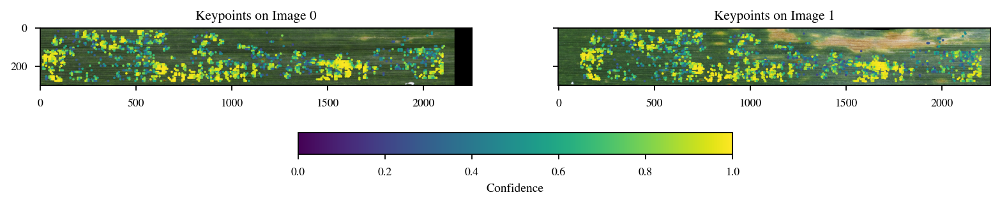

In [26]:
_=plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)

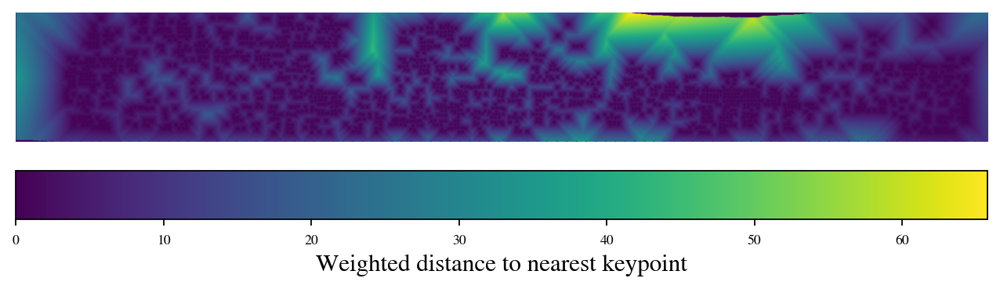

max gap: 65.79817962646484
90th percentile: 26.536409378051758
95th percentile: 35.867393493652344
97th percentile: 42.320960998535156
99th percentile: 51.603126525878906


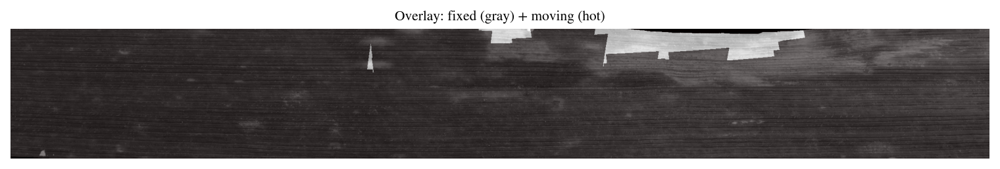

In [ ]:
def keypoint_coverage(img, mask, keypoints, threshold, erode_px=50):

    # mask: (H, W) with 1 = foreground, 0 = background
    # points: list of (row, col)

    H, W = mask.shape[2:]
    # print(mask.shape)
    # print(H,W)

    # create tensor
    # mask_t = torch.tensor(mask, dtype=torch.float32)[None, None]  # (1,1,H,W)

    # create point image: 1 everywhere, 0 at points
    point_img = torch.zeros((1, 1, H, W), dtype=torch.float32)
    for x, y in keypoints:
        # print(r,c)
        point_img[0, 0, int(y), int(x)] = 1.0


    # print(point_img.unique())
    # plt.figure(figsize=(15, 15))
    # pm=plt.imshow(K.tensor_to_image(point_img))
    # plt.colorbar(pm, orientation='horizontal', pad=0.1)
    # plt.show()
    
    # distance transform
    dist = K.contrib.distance_transform(point_img)#, kernel_size=11)
    # print(dist.unique())
    # plt.figure(figsize=(15, 15))
    # ds = plt.imshow(K.tensor_to_image(dist))
    # plt.colorbar(ds, orientation='horizontal', pad=0.1)
    # plt.show()

    # erode mask to mitigate border effects
    # if erode_px > 0:
    #     kernel = torch.ones((5,5), dtype=torch.float32, device=mask.device)
    #     for _ in range(int(erode_px/5)):
    #         # unsqueeze mask to add batch dim
    #         mask = K.morphology.erosion(mask, kernel, border_type='constant')




    # keep only foreground
    dist_fg = dist * mask
    # print(dist_fg.unique())
    # plt.figure(figsize=(15, 15))
    ds_m = plt.imshow(K.tensor_to_image(dist_fg))
    plt.colorbar(ds_m, orientation='horizontal', pad=0.1)
    plt.show()


    y = torch.linspace(0, 1, H).view(H, 1).expand(H, W)
    x = torch.linspace(0, 1, W).view(1, W).expand(H, W)

    # distance to horizontal center (penalize left/right less)
    x_weight = 1.0 - 0.7 * (2 * torch.abs(x - 0.5))  # strong reduction at edges

    # distance to vertical center (penalize top/bottom slightly less)
    y_weight = 1.0 - 0.3 * (2 * torch.abs(y - 0.5))  # mild reduction

    weight = x_weight * y_weight
    weight = weight.clamp(min=0.1)  # avoid zeroing things out

    weighted_dist = dist_fg * weight
    plt.figure(figsize=(10,6))
    ds_w = plt.imshow(K.tensor_to_image(weighted_dist))
    cbar = plt.colorbar(ds_w, orientation='horizontal', pad=0.05)
    # cbar.ax.tick_params(labelsize=15)
    cbar.set_label("Weighted distance to nearest keypoint", size=14)
    plt.axis('off')
    plt.show()

    max_gap = weighted_dist.max()
    masked_weighted_dist = weighted_dist[mask > 0]
    p90 = torch.quantile(masked_weighted_dist, 0.9)
    p95 = torch.quantile(masked_weighted_dist, 0.95)
    p97 = torch.quantile(masked_weighted_dist, 0.97)
    p99 = torch.quantile(masked_weighted_dist, 0.99)
    mean_gap = weighted_dist[mask > 0].mean()

    # metrics
    # max_gap = dist_fg.max()
    # mean_gap = dist_fg[mask > 0].mean()

    print("max gap:", max_gap.item())
    print("90th percentile:", p90.item())
    print("95th percentile:", p95.item())
    print("97th percentile:", p97.item())
    print("99th percentile:", p99.item())
    # print("mean gap:", mean_gap.item())

    holes = weighted_dist > threshold  # boolean map
    # print(torch.sum(holes))
    # plt.figure(figsize=(15, 15))
    _=plot_overlay(img, holes)
    return weighted_dist

weight_map =keypoint_coverage(img_moving, mask_moving, mkpts1, threshold=40, erode_px=0)

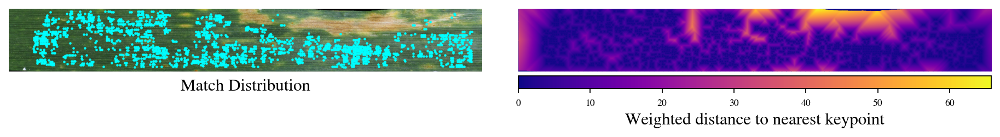

In [70]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, axes = plt.subplots(1,2, figsize=(12,8))
axes[0].imshow(K.tensor_to_image(img_moving))
mtc = axes[0].scatter(mkpts1[:,0], mkpts1[:,1], c='cyan', s=3)
# mtc = axes[0].scatter(mkpts1[:,0], mkpts1[:,1], c=confidence, cmap='viridis', vmin=0, vmax=1, s=3)
divider = make_axes_locatable(axes[0])
cax = divider.append_axes('bottom', size='20%', pad=0.05)
cax.axis('off')
axes[0].set_title("Match Distribution", fontsize=14, y=-0.42)
# cbar = fig.colorbar(mtc, cax=cax, orientation='horizontal')
# cbar.set_label("Match Confidence", size=14)
axes[0].axis('off')
# axes[0].set_xticks([])
# axes[0].set_yticks([])


ds_w = axes[1].imshow(K.tensor_to_image(weight_map), cmap='plasma')
divider = make_axes_locatable(axes[1])
cax = divider.append_axes('bottom', size='20%', pad=0.05)
cbar = fig.colorbar(ds_w, cax=cax, orientation='horizontal')
# cbar = axes[1].colorbar(ds_w, orientation='horizontal', pad=0.05)
# cbar.ax.tick_params(labelsize=15)
cbar.set_label("Weighted distance to nearest keypoint", size=14)
axes[1].axis('off')
# axes[1].set_xticks([])
# axes[1].set_yticks([])
fig.tight_layout()
fig.show()

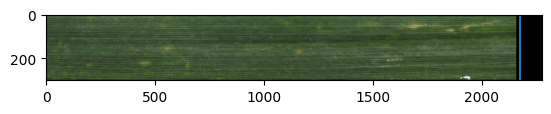

In [76]:
plt.imshow(K.tensor_to_image(img_fixed))
plt.vlines(x=img_fixed.shape[3]-100, ymin=0, ymax=img_fixed.shape[2]-1)
plt.show()

In [6]:
print(torch.sum(mask_fixed).item()*(1-0.9), np.sqrt(torch.sum(mask_fixed).item()*(1-0.9)))
print(torch.sum(mask_fixed).item()*(1-0.95), np.sqrt(torch.sum(mask_fixed).item()*(1-0.95)))
print(torch.sum(mask_fixed).item()*(1-0.97), np.sqrt(torch.sum(mask_fixed).item()*(1-0.97)))
print(torch.sum(mask_fixed).item()*(1-0.99), np.sqrt(torch.sum(mask_fixed).item()*(1-0.99)))

64558.39999999999 254.08345085817766
32279.20000000003 179.66413108909643
19367.52000000002 139.16723752377933
6455.840000000006 80.34824204673059


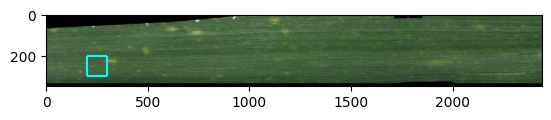

In [41]:
plt.imshow(K.tensor_to_image(img_fixed))
plt.vlines(x=200, ymin=200, ymax=300, color="cyan")
plt.vlines(x=300, ymin=200, ymax=300, color="cyan")
plt.hlines(y=200, xmin=200, xmax=300, color="cyan")
plt.hlines(y=300, xmin=200, xmax=300, color="cyan")
plt.show()

Warp Consistency: 10.4176s
2448 Matches


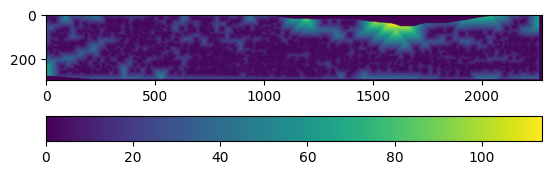

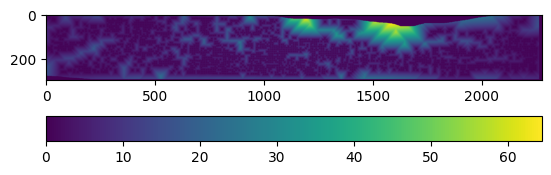

max gap: 64.47907257080078
90th percentile: 15.984543800354004
95th percentile: 25.350093841552734
97th percentile: 34.47675323486328
99th percentile: 48.335140228271484


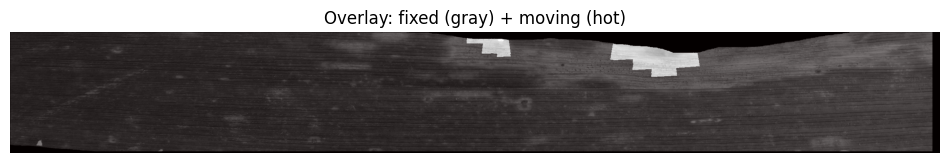

Coverage: 1.3160s
Total Time: 11.7338s


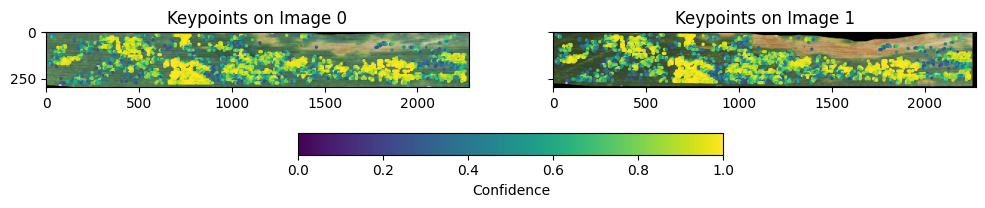

In [16]:
fix_ind = 5
mov_ind = 8
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
angle = find_roi_rotation(mask_fixed)
out = affine_warp_expand(img_fixed, mask_fixed, rot_angle_deg=-angle)
img_fixed = out["imgs"]
mask_fixed = out["masks"]


img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
angle = find_roi_rotation(mask_moving)
out = affine_warp_expand(img_moving, mask_moving, rot_angle_deg=-angle)
img_moving = out["imgs"]
mask_moving = out["masks"]
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
# _ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=False, return_n_matches=True)

# medium transform, consistent keypoints
start1 = time.time()
kpts0, kpts1, confidence_consistent = warp_consistency(img_fixed, img_moving, mask_moving, plot_matches=False, rotation=-10, tolerance=5, verbose=False)

end1 = time.time()
print(f"Warp Consistency: {end1 - start1:.4f}s")
print(f"{kpts0.shape[0]} Matches")

threshold = 0.3
# kpts0, kpts1 = filter_matches_by_grid(kpts0, kpts1, confidence_consistent, img_width=img_fixed.shape[3], cell_size=cell_size, threshold=threshold)
n_clusters = 500
# kpts0, kpts1 = filter_matches_by_cluster(kpts0, kpts1, confidence_consistent, n_clusters=n_clusters, threshold=threshold)
# kpts0, kpts1 = filter_matches_by_confidence(kpts0, kpts1, confidence_consistent, threshold=0.5, verbose=False)

# filter by min_dist
# min_dist = 20
# max_points=500
# threshold=0.0
# kpts0, kpts1 = filter_matches_by_min_distance(kpts0, kpts1, confidence_consistent, min_dist=min_dist, max_points=max_points, threshold=threshold)

# print(f"{kpts0.shape[0]} Matches")


start2 = time.time()
keypoint_coverage(img_moving, mask_moving, kpts1, threshold=40)
end2 = time.time()
print(f"Coverage: {end2 - start2:.4f}s")
print(f"Total Time: {end2 - start1:.4f}s")
_=plot_match_coverage(img_fixed, kpts0, img_moving, kpts1, confidence_consistent)

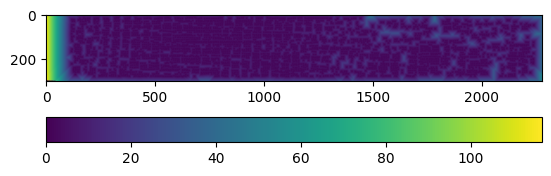

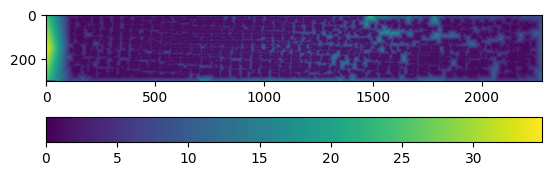

max gap: 34.82105255126953
mean gap: 4.3046770095825195


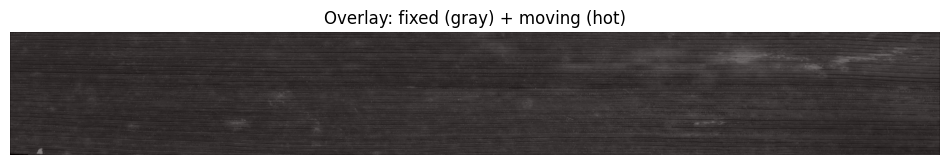

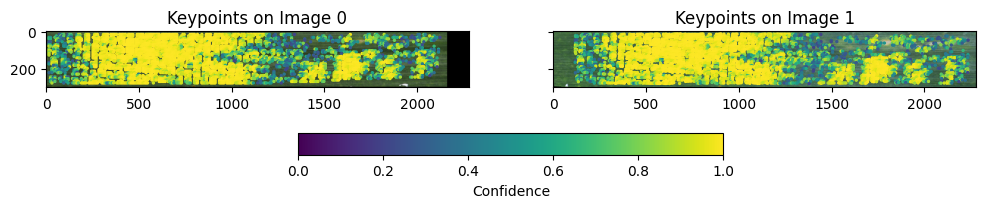

In [ ]:
# img2, threshold 40
keypoint_coverage(img_moving, mask_moving, kpts1, threshold=40)
_=plot_match_coverage(img_fixed, kpts0, img_moving, kpts1, confidence_consistent)

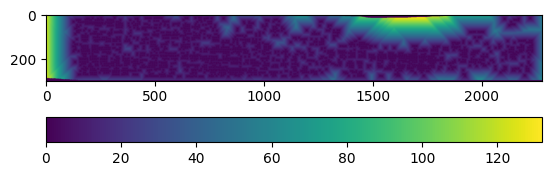

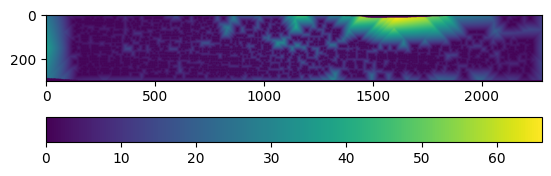

max gap: 66.0291519165039
mean gap: 9.255091667175293


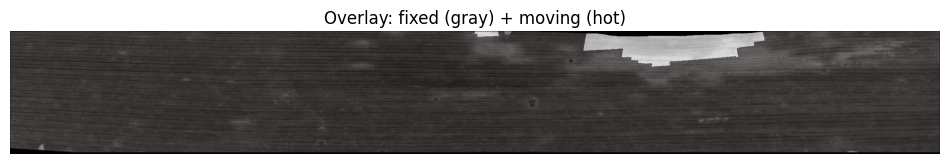

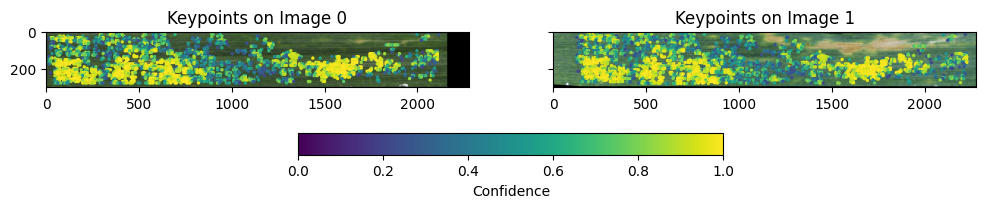

In [ ]:
# img5, threshold 40
keypoint_coverage(img_moving, mask_moving, kpts1, threshold=40)
_=plot_match_coverage(img_fixed, kpts0, img_moving, kpts1, confidence_consistent)

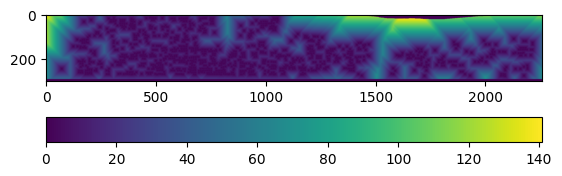

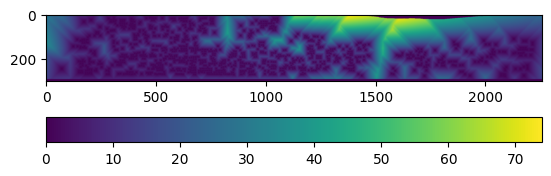

max gap: 73.96231842041016
mean gap: 13.654156684875488


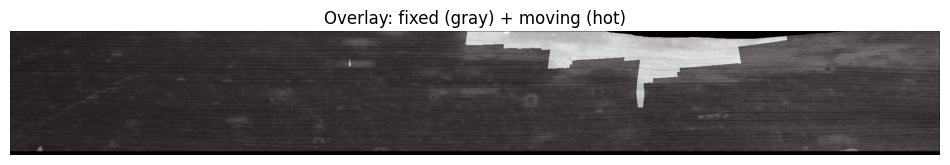

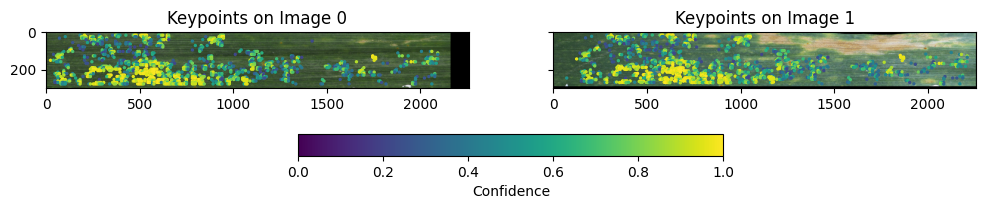

In [30]:
# img7, threshold 40
keypoint_coverage(img_moving, mask_moving, kpts1, threshold=40)
_=plot_match_coverage(img_fixed, kpts0, img_moving, kpts1, confidence_consistent)

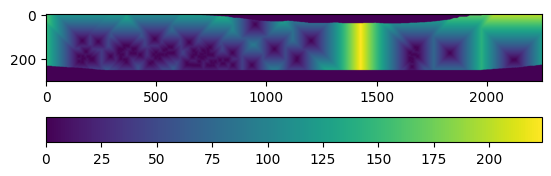

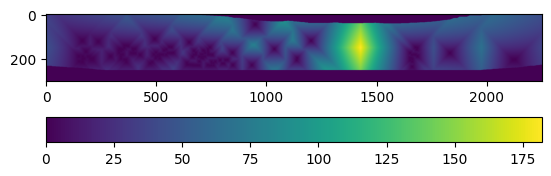

max gap: 182.0071563720703
mean gap: 40.070125579833984


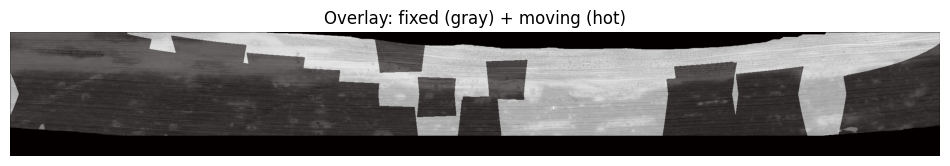

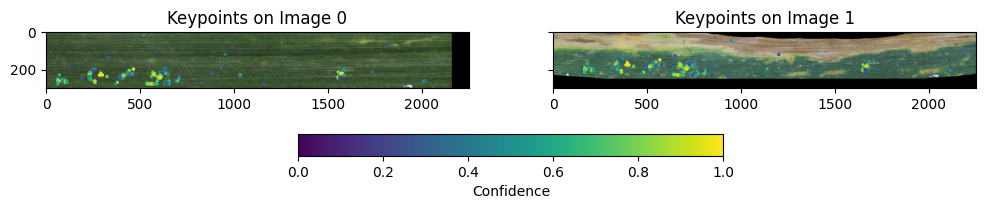

In [32]:
# img13, threshold 40
keypoint_coverage(img_moving, mask_moving, kpts1, threshold=40)
_=plot_match_coverage(img_fixed, kpts0, img_moving, kpts1, confidence_consistent)

In [ ]:
from leafalignment.loftr import fetch_keypoints
out = fetch_keypoints(
    img_fixed,
    img_moving, 
    mask_fixed,
    mask_moving,
    warp_consistency={'consistency_tolerance': 5, 'transform': {'type': 'rotation', 'params': {'rotation': -10}}},
    # match_filtering,
    verbose=True
)

len(out['mkpts1'])

Detecting LoFTR Matches...
Total matches: 8482
Matches with Confidence > 0.5: 5945
Inliers: 4991 (58.84%)
Total matches: 9650
Matches with Confidence > 0.5: 7878
Inliers: 9542 (98.88%)
Total matches: 4569
Matches with Confidence > 0.5: 2830
Inliers: 2969 (64.98%)
Img1 -> Img2: 8482 Matches
Img2 -> Img3: 9650 Matches
Img3 -> Img1: 4569 Matches


3113

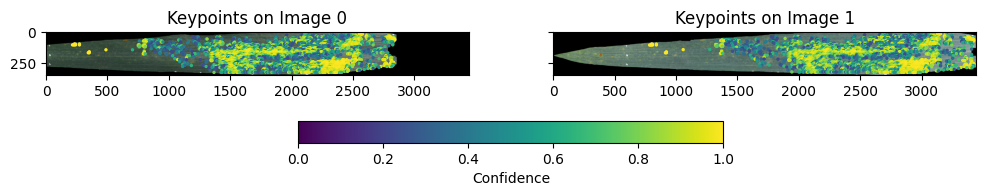

In [ ]:
from leafalignment.registration import keypoint_coverage
keypoint_coverage(mask_moving, out['mkpts1'], dist_threshold=40)
# keypoint_coverage(img_moving, mask_moving, out['mkpts1'], threshold=40)
_=plot_match_coverage(img_fixed, out['mkpts0'], img_moving, out['mkpts1'], out['confidence'])